In [1]:
import matplotlib.pyplot as plt
import os
import pandas as pd
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from collections import Counter
from copy import deepcopy
from PIL import Image
from sklearn.model_selection import train_test_split
from time import time
from torch.utils.data import DataLoader, TensorDataset

sns.set_theme()
torch.manual_seed(0)
(current_device := torch.device("cuda" if torch.cuda.is_available() else "cpu"))

device(type='cuda')

# Первый взгляд на набор данных

In [2]:
class_names = [class_name for class_name in sorted(os.listdir("weather"))]
n_classes = len(class_names)

image_paths = []
image_labels = []

for class_name in class_names:
    class_dir = os.path.join("weather", class_name)
    for image_name in os.listdir(class_dir):
        image_paths.append(os.path.join(class_dir, image_name))
        image_labels.append(class_name)

(class_counts := Counter(image_labels))

Counter({'rime': 1160,
         'fogsmog': 851,
         'dew': 698,
         'sandstorm': 692,
         'glaze': 639,
         'snow': 621,
         'hail': 591,
         'rain': 526,
         'frost': 475,
         'lightning': 377,
         'rainbow': 232})

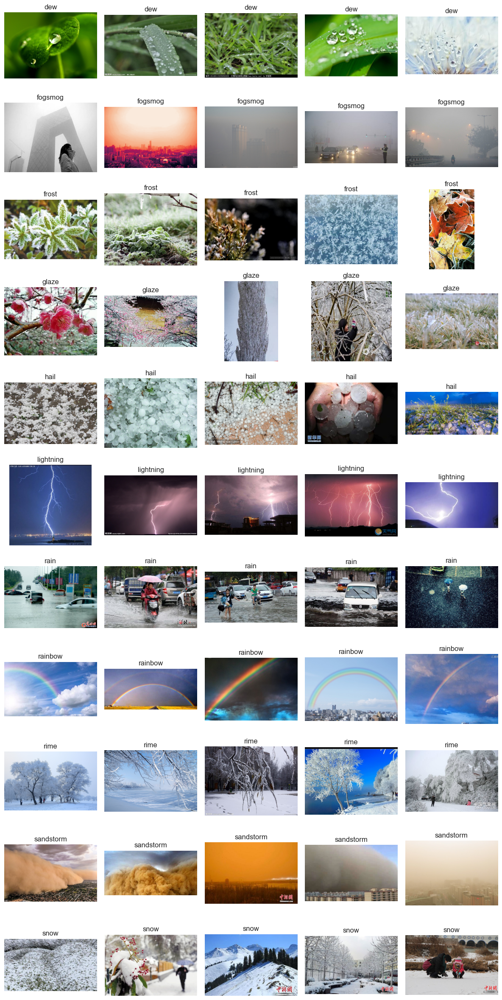

In [3]:
n_samples = 5
fig, axes = plt.subplots(nrows=n_classes, ncols=n_samples, figsize=(12, 24))

for i, class_name in enumerate(class_names):
    class_dir = os.path.join("weather", class_name)
    for j, image_name in zip(range(n_samples), os.listdir(class_dir)):
        image_path = os.path.join(class_dir, image_name)
        axes[i, j].imshow(Image.open(image_path))
        axes[i, j].axis("off")
        axes[i, j].set_title(class_name)

plt.tight_layout()

# Разбиение на выборки и добавление аугментаций

In [4]:
class_indices = {name: index for index, name in enumerate(class_names)}
labels = [class_indices[label] for label in image_labels]

train_paths, temp_paths, train_labels, temp_labels = train_test_split(
    image_paths, labels, test_size=0.3, random_state=0, stratify=labels
)

valid_paths, test_paths, valid_labels, test_labels = train_test_split(
    temp_paths, temp_labels, test_size=0.5, random_state=0, stratify=temp_labels
)

# Среднее и стандартное отклонение по трём цветовым каналам, посчитанные на ImageNet
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
image_size = 224

transform_aug = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(degrees=15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomResizedCrop(size=image_size, scale=(0.8, 1.0)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])

transform_base = transforms.Compose([
    transforms.Resize((image_size, image_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=mean, std=std),
])


def get_data_tensors(image_paths, labels, tf_base, tf_aug=None, aug_counts=None):
    tensors_list = []
    targets_list = []

    for image_path, label in zip(image_paths, labels):
        image = Image.open(image_path).convert("RGB")
        tensor_base = tf_base(image)

        tensors_list.append(tensor_base)
        targets_list.append(label)

        if aug_counts:
            for _ in range(aug_counts[class_names[label]]):
                tensor_aug = tf_aug(image)

                tensors_list.append(tensor_aug)
                targets_list.append(label)
        
    tensors = torch.stack(tensors_list, dim=0)
    targets = torch.tensor(targets_list)

    return tensors, targets


aug_counts = {
    "dew": 0,
    "fogsmog": 0,
    "frost": 1,
    "glaze": 1,
    "hail": 1,
    "lightning": 2,
    "sandstorm": 0,
    "rain": 1,
    "rainbow": 4,
    "rime": 0,
    "snow": 1,
}

train_tensors, train_targets = get_data_tensors(
    train_paths, train_labels, transform_base, transform_aug, aug_counts
)

valid_tensors, valid_targets = get_data_tensors(
    valid_paths, valid_labels, transform_base
)

test_tensors, test_targets = get_data_tensors(
    test_paths, test_labels, transform_base
)

torch.save((train_tensors, train_targets), "./data/weather_train.pt")
torch.save((valid_tensors, valid_targets), "./data/weather_valid.pt")
torch.save((test_tensors, test_targets), "./data/weather_test.pt")

print(
    f"Общее количество изображений: {len(image_paths)}",
    f"Размер обучающей выборки: {len(train_paths)}",
    f"Размер валидационной выборки: {len(valid_tensors)}",
    f"Размер тестовой выборки: {len(test_tensors)}",
    f"Создано изображений с аугментациями: {len(train_tensors) - len(train_paths)}",
    f"Всего изображений для обучения: {len(train_tensors)}",
    f"Формат одного изображения: {train_tensors[0].shape}",
    f"Пример истинной метки: {train_targets[0]}",
    sep="\n"
)

train_counts = Counter(train_labels)
train_aug_counts = Counter(train_targets.numpy())
valid_counts = Counter(valid_targets.numpy())
test_counts = Counter(test_targets.numpy())
total_counts = train_aug_counts + valid_counts + test_counts

counts_list = []
for label, class_name in enumerate(class_names):
    counts_list.append({
        "class": class_name,
        "train": train_counts[label],
        "aug": train_aug_counts[label] - train_counts[label],
        "valid": valid_counts[label],
        "test": test_counts[label],
        "total": total_counts[label],
    })

counts_df = pd.DataFrame(counts_list)
counts_df.sort_values("total", ascending=False).style.hide(axis="index")

Общее количество изображений: 6862
Размер обучающей выборки: 4803
Размер валидационной выборки: 1029
Размер тестовой выборки: 1030
Создано изображений с аугментациями: 3172
Всего изображений для обучения: 7975
Формат одного изображения: torch.Size([3, 224, 224])
Пример истинной метки: 2


class,train,aug,valid,test,total
rime,812,0,174,174,1160
glaze,447,447,96,96,1086
snow,435,435,93,93,1056
hail,414,414,88,89,1005
lightning,264,528,57,56,905
rain,368,368,79,79,894
rainbow,162,648,35,35,880
fogsmog,596,0,127,128,851
frost,332,332,72,71,807
dew,489,0,104,105,698


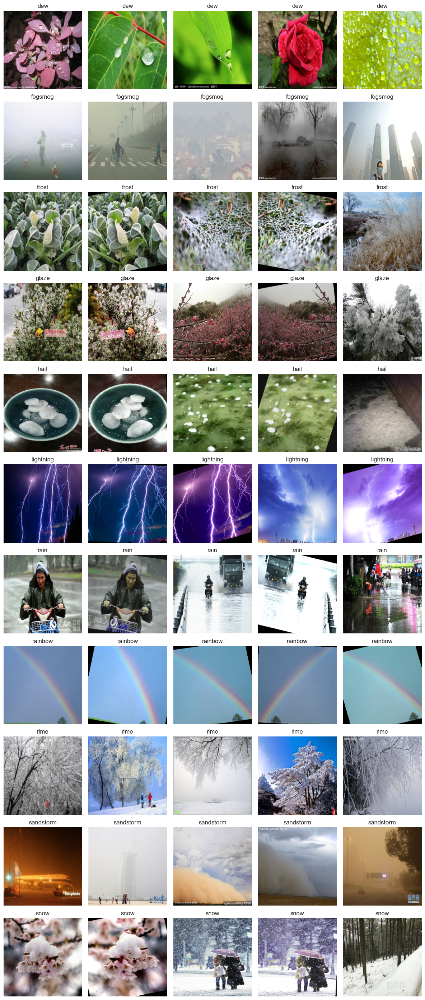

In [5]:
def show_image_from_tensor(image_tensor, title="", ax=None):
    if not ax:
        ax = plt.gca()
    
    mean_tensor = torch.tensor(mean).view(3, 1, 1)
    std_tensor = torch.tensor(std).view(3, 1, 1)

    image_tensor = image_tensor * std_tensor + mean_tensor
    image_tensor = image_tensor.clamp(0, 1)
    image_array = image_tensor.permute(1, 2, 0).detach().cpu().numpy()

    ax.imshow(image_array)
    ax.axis("off")
    if title:
        ax.set_title(title)


image_samples = {label: [] for label in range(n_classes)}

for index, target in enumerate(train_targets):
    label = target.item()
    if len(image_samples[label]) < n_samples:
        image_samples[label].append(index)
    if all(len(image_samples[label]) == n_samples for label in range(n_classes)):
        break

fig, axes = plt.subplots(nrows=n_classes, ncols=n_samples, figsize=(12, 28))

for label, class_name in enumerate(class_names):
    for col_index, image_index in enumerate(image_samples[label]):
        show_image_from_tensor(
            train_tensors[image_index],
            title=class_name,
            ax=axes[label, col_index]
        )

plt.tight_layout()

# Подготовка данных для обучения моделей

In [6]:
train_tensors, train_targets = torch.load("./data/weather_train.pt")
valid_tensors, valid_targets = torch.load("./data/weather_valid.pt")
test_tensors, test_targets = torch.load("./data/weather_test.pt")

train_dataset = TensorDataset(train_tensors, train_targets)
valid_dataset = TensorDataset(valid_tensors, valid_targets)
test_dataset = TensorDataset(test_tensors, test_targets)

batch_size = 32

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

batch_images, batch_labels = next(iter(train_loader))

print(
    f"Форма батча изображений: {batch_images.shape}",
    f"Форма батча меток: {batch_labels.shape}",
    sep="\n"
)

Форма батча изображений: torch.Size([32, 3, 224, 224])
Форма батча меток: torch.Size([32])


# Создание моделей

In [7]:
class WeatherMLP(nn.Module):
    def __init__(self, n_classes):
        super().__init__()

        # (batch, 3, 224, 224) -> (batch, 3, 16, 16)
        self.input_pool = nn.AdaptiveAvgPool2d((16, 16))

        self.classifier = nn.Sequential(
            nn.Flatten(),  # (batch, 3, 16, 16) -> (batch, 768)
            nn.Linear(3 * 16 * 16, 512),  # (batch, 768) -> (batch, 512)
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, 256),  # (batch, 512) -> (batch, 256)
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, n_classes)  # (batch, 256) -> (batch, n_classes)
        )

    def forward(self, x):
        x = self.input_pool(x)
        return self.classifier(x)


class WeatherCNN(nn.Module):
    def __init__(self, n_classes):
        super().__init__()

        self.conv_block_1 = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),  # (batch, 3, 224, 224) -> (batch, 32, 224, 224)
            nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),  # (batch, 32, 224, 224) -> (batch, 32, 224, 224)
            nn.ReLU(),
            nn.MaxPool2d(2),  # (batch, 32, 224, 224) -> (batch, 32, 112, 112)
            nn.Dropout2d(0.2),
        )

        self.conv_block_2 = nn.Sequential(
            nn.Conv2d(32, 64, kernel_size=3, padding=1),  # (batch, 32, 112, 112) -> (batch, 64, 112, 112)
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),  # (batch, 64, 112, 112) -> (batch, 64, 112, 112)
            nn.ReLU(),
            nn.MaxPool2d(2),  # (batch, 64, 112, 112) -> (batch, 64, 56, 56)
            nn.Dropout2d(0.3),
        )

        self.conv_block_3 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),  # (batch, 64, 56, 56) -> (batch, 128, 56, 56)
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),  # (batch, 128, 56, 56) -> (batch, 128, 56, 56)
            nn.ReLU(),
            nn.MaxPool2d(2),  # (batch, 128, 56, 56) -> (batch, 128, 28, 28)
            nn.Dropout2d(0.4),
        )

        self.conv_block_4 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),  # (batch, 128, 28, 28) -> (batch, 256, 28, 28)
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),  # (batch, 256, 28, 28) -> (batch, 256, 28, 28)
            nn.ReLU(),
            nn.MaxPool2d(2),  # (batch, 256, 28, 28) -> (batch, 256, 14, 14)
            nn.Dropout2d(0.4),
        )

        # (batch, 256, 14, 14) -> (batch, 256, 4, 4)
        self.global_pool = nn.AdaptiveAvgPool2d((4, 4))

        self.classifier = nn.Sequential(
            nn.Flatten(),  # (batch, 256, 4, 4) -> (batch, 4096)
            nn.Linear(256 * 4 * 4, 256),  # (batch, 4096) -> (batch, 256)
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(256, n_classes),  # (batch, 256) -> (batch, n_classes)
        )

    def forward(self, x):
        x = self.conv_block_1(x)
        x = self.conv_block_2(x)
        x = self.conv_block_3(x)
        x = self.conv_block_4(x)
        x = self.global_pool(x)
        return self.classifier(x)


class EarlyStopping:
    def __init__(self, patience, min_delta, mode):
        self.patience = patience  # количество эпох без улучшений, после которых нужна остановка
        self.min_delta = min_delta  # минимальное изменение, считающееся улучшением
        self.mode = mode  # "max" – чем больше, тем лучше; "min" – чем меньше, тем лучше
        self.counter = 0  # счётчик эпох без улучшений
        self.best_score = None  # лучшее значение метрики оценки качества
        self.early_stop = False  # флаг необходимости остановки
        self.best_model_state = None  # состояние лучшей модели
    
    def __call__(self, current_score, model):
        # Первый вызов
        if self.best_score is None:
            # Сохранение значения метрики
            self.best_score = current_score
            # Сохранение весов модели
            self.best_model_state = deepcopy(model.state_dict())

        # Проверка на отсутствие улучшения
        elif (self.mode == "max" and current_score < self.best_score + self.min_delta) or \
             (self.mode == "min" and current_score > self.best_score - self.min_delta):
            # Увеличение счётчика эпох без улучшений
            self.counter += 1
            # Если достигнуто задананное количество эпох без улучшений, то выполняется остановка
            if self.counter >= self.patience:
                self.early_stop = True
        
        # Фиксация улучшения
        else:
            # Сохранение лушчего значения метрики
            self.best_score = current_score
            # Сохранение лучших весов модели
            self.best_model_state = deepcopy(model.state_dict())
            # Обнуление счётчика эпоха без улучшений
            self.counter = 0


def train_epoch(model, loader, optimizer, criterion, device):
    # Переключение модели в режим обучения
    model.train()

    running_loss = 0.0  # суммарная ошибка
    correct = 0  # количество правильных ответов
    total = 0  # общее число обработанных примеров

    # Проход по батчам данных
    for inputs, targets in loader:
        # Перемещение тензоров на указанный CPU или GPU
        inputs, targets = inputs.to(device, non_blocking=True), targets.to(device, non_blocking=True)

        # Обнуление градиентов перед вычислением градиентов нового батча
        optimizer.zero_grad()
        # Прямой проход: получение сырых предсказаний
        outputs = model(inputs)
        # Вычисление функции потерь
        loss = criterion(outputs, targets)
        # Обратный проход: вычисление градиентов функции потерь по всем параметрам модели
        loss.backward()
        # Обновление весов модели
        optimizer.step()
        
        # Прибавление суммарных потерь для всех примеров батча
        running_loss += loss.item() * inputs.size(0)
        # Получение предсказанных классов
        _, predicted = torch.max(outputs, 1)
        # Прибавление количества обработанных примеров
        total += targets.size(0)
        # Прибавление количества верных ответов
        correct += (predicted == targets).sum().item()
    
    # Вычисление средних потерь за эпоху
    epoch_loss = running_loss / total
    # Вычисление точности за эпоху
    epoch_acc = correct / total

    return epoch_loss, epoch_acc


def evaluate(model, loader, criterion, device):
    # Переключение модели в режим оценки
    model.eval()

    running_loss = 0.0  # суммарная ошибка
    correct = 0  # количество правильных ответов
    total = 0  # общее число обработанных примеров

    # Отключение автоматического вычисления градиентов
    with torch.no_grad():
        # Проход по батчам данных
        for inputs, targets in loader:
            # Перемещение тензоров на указанный CPU или GPU
            inputs, targets = inputs.to(device), targets.to(device)

            # Прямой проход: получение сырых предсказаний
            outputs = model(inputs)
            # Вычисление функции потерь
            loss = criterion(outputs, targets)

            # Прибавление суммарных потерь для всех примеров батча
            running_loss += loss.item() * inputs.size(0)
            # Получение предсказанных классов
            _, predicted = torch.max(outputs, 1)
            # Прибавление количества обработанных примеров
            total += targets.size(0)
            # Прибавление количества верных ответов
            correct += (predicted == targets).sum().item()
    
    # Вычисление средних потерь за эпоху
    epoch_loss = running_loss / total
    # Вычисление точности за эпоху
    epoch_acc = correct / total
    
    return epoch_loss, epoch_acc


def predict(model, loader, device):
    # Переключение модели в режим оценки
    model.eval()

    # Список для тензоров вероятностей
    all_probs = []

    # Отключение автоматического вычисления градиентов
    with torch.no_grad():
        # Проход по батчам данных
        for data, _ in loader:
            # Перемещение тензоров на указанный CPU или GPU
            data = data.to(device)
            
            # Прямой проход: получение сырых предсказаний (логитов)
            output = model(data)

            # Преобразование логитов в вероятности распределения по классам
            probs = torch.softmax(output, dim=1)

            # Перемещение тензоров с GPU на CPU при необходимости
            # и добавление в список тензора вида (batch_size, 10)
            all_probs.append(probs.cpu())
    
    # Объединение списка тензоров в один массив вида (loader_size, 10)
    return torch.cat(all_probs).numpy()

In [8]:
n_classes = 11

resnet18 = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
resnet18.fc = nn.Linear(resnet18.fc.in_features, n_classes)

mobilenet_v3_large = models.mobilenet_v3_large(weights=models.MobileNet_V3_Large_Weights.DEFAULT)
mobilenet_v3_large.classifier[3] = nn.Linear(mobilenet_v3_large.classifier[3].in_features, n_classes)

efficientnet_b0 = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)
efficientnet_b0.classifier[1] = nn.Linear(efficientnet_b0.classifier[1].in_features, n_classes)

models_dict = {
    "WeatherMLP": WeatherMLP(n_classes=n_classes),
    "WeatherCNN": WeatherCNN(n_classes=n_classes),
    "ResNet18": resnet18,
    "MobileNetV3-Large": mobilenet_v3_large,
    "EfficientNet-B0": efficientnet_b0,
}

models_list = []

for model_name, model in models_dict.items():
    model = model.to(current_device)

    models_list.append({
        "Модель": model_name,
        "Параметров": sum(p.numel() for p in model.parameters()),
    })

models_df = pd.DataFrame(models_list)
models_df.style.hide(axis="index")

Модель,Параметров
WeatherMLP,527883
WeatherCNN,2223915
ResNet18,11182155
MobileNetV3-Large,4216123
EfficientNet-B0,4021639


# Обучение моделей

In [9]:
learning_rate = 0.001
criterion = nn.CrossEntropyLoss()
n_epochs = 50

warmup_lr = 0.001
n_warmup_epochs = 5
fine_tune_lr = 0.0001

scheduler_mode = "max"
scheduler_factor = 0.5
scheduler_patience = 3

early_stopping_patience = 5
early_stopping_min_delta = 0.001
early_stopping_mode = "max"

histories = {}


def train_model(model_name, model):
    model = model.to(current_device)

    print(f"Обучение модели '{model_name}':")
    
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.CrossEntropyLoss()

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer=optimizer,
        mode=scheduler_mode,
        factor=scheduler_factor,
        patience=scheduler_patience,
    )

    early_stopping = EarlyStopping(
        patience=early_stopping_patience,
        min_delta=early_stopping_min_delta,
        mode=early_stopping_mode,
    )
    
    train_losses, valid_losses = [], []
    train_accs, valid_accs = [], []

    start_time = time()
    
    for epoch in range(n_epochs):
        epoch_start_time = time()

        train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion, current_device)
        valid_loss, valid_acc = evaluate(model, valid_loader, criterion, current_device)

        epoch_end_time = time()
        epoch_time = round(epoch_end_time - epoch_start_time)
        
        train_losses.append(train_loss)
        valid_losses.append(valid_loss)
        train_accs.append(train_acc)
        valid_accs.append(valid_acc)
        
        print(f"Epoch {epoch + 1:2d}/{n_epochs} ({epoch_time}s) - "
              f"train_acc: {train_acc:.4f} - train_loss: {train_loss:.4f} - "
              f"valid_acc: {valid_acc:.4f} - valid_loss: {valid_loss:.4f} - "
              f"lr: {round(optimizer.param_groups[0]["lr"], 6)}")
        
        scheduler.step(valid_acc)
        
        early_stopping(valid_acc, model)
        if early_stopping.early_stop:
            print(f"Ранняя остановка на эпохе {epoch + 1}")
            break
    
    end_time = time()
    elapsed_time = round(end_time - start_time)

    model.load_state_dict(early_stopping.best_model_state)
    best_epoch = len(train_losses) - early_stopping.counter
    print(f"Лучшая точность на валидации: {early_stopping.best_score:.4f} (эпоха {best_epoch})")

    print(f"Время обучения модели '{model_name}': {elapsed_time} секунд")
    
    test_loss, test_acc = evaluate(model, test_loader, criterion, current_device)

    torch.save(model.state_dict(), f"./models/{model_name}.pt")

    model.to("cpu")
    torch.cuda.empty_cache()
    
    return {
        "train_losses": train_losses,
        "train_accs": train_accs,
        "valid_losses": valid_losses,
        "valid_accs": valid_accs,
        "test_loss": test_loss,
        "test_acc": test_acc,
        "best_epoch": best_epoch,
    }


def fine_tune_model(model_name, model):
    model = model.to(current_device)

    print(f"Обучение только классификатора модели '{model_name}':")

    for param in model.parameters():
        param.requires_grad = False
    
    if model_name == "ResNet18":
        for param in model.fc.parameters():
            param.requires_grad = True
    elif model_name == "EfficientNet-B0":
        for param in model.classifier.parameters():
            param.requires_grad = True
    elif model_name == "MobileNetV3-Large":
        for param in model.classifier.parameters():
            param.requires_grad = True
    
    warmup_optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=warmup_lr)
    warmup_scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer=warmup_optimizer,
        mode=scheduler_mode,
        factor=scheduler_factor,
        patience=scheduler_patience,
    )
    
    train_losses, valid_losses = [], []
    train_accs, valid_accs = [], []

    start_time = time()

    for epoch in range(n_warmup_epochs):
        epoch_start_time = time()

        train_loss, train_acc = train_epoch(model, train_loader, warmup_optimizer, criterion, current_device)
        valid_loss, valid_acc = evaluate(model, valid_loader, criterion, current_device)

        epoch_end_time = time()
        epoch_time = round(epoch_end_time - epoch_start_time)
        
        train_losses.append(train_loss)
        valid_losses.append(valid_loss)
        train_accs.append(train_acc)
        valid_accs.append(valid_acc)
        
        print(f"Epoch {epoch + 1}/{n_warmup_epochs} ({epoch_time}s) - "
              f"train_acc: {train_acc:.4f} - train_loss: {train_loss:.4f} - "
              f"valid_acc: {valid_acc:.4f} - valid_loss: {valid_loss:.4f} - "
              f"lr: {round(warmup_optimizer.param_groups[0]["lr"], 6)}")
        
        warmup_scheduler.step(valid_acc)
    
    print(f"\nОбучение всех слоёв модели '{model_name}':")

    for param in model.parameters():
        param.requires_grad = True
    
    optimizer = optim.Adam(model.parameters(), lr=fine_tune_lr)

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer=optimizer,
        mode=scheduler_mode,
        factor=scheduler_factor,
        patience=scheduler_patience,
    )

    early_stopping = EarlyStopping(
        patience=early_stopping_patience,
        min_delta=early_stopping_min_delta,
        mode=early_stopping_mode,
    )
    
    for epoch in range(n_epochs):
        epoch_start_time = time()

        train_loss, train_acc = train_epoch(model, train_loader, optimizer, criterion, current_device)
        valid_loss, valid_acc = evaluate(model, valid_loader, criterion, current_device)

        epoch_end_time = time()
        epoch_time = round(epoch_end_time - epoch_start_time)
        
        train_losses.append(train_loss)
        valid_losses.append(valid_loss)
        train_accs.append(train_acc)
        valid_accs.append(valid_acc)
        
        print(f"Epoch {epoch + 1:2d}/{n_epochs} ({epoch_time}s) - "
              f"train_acc: {train_acc:.4f} - train_loss: {train_loss:.4f} - "
              f"valid_acc: {valid_acc:.4f} - valid_loss: {valid_loss:.4f} - "
              f"lr: {round(optimizer.param_groups[0]["lr"], 6)}")
        
        scheduler.step(valid_acc)
        
        early_stopping(valid_acc, model)
        if early_stopping.early_stop:
            print(f"Ранняя остановка на эпохе {epoch + 1}")
            break
    
    end_time = time()
    elapsed_time = round(end_time - start_time)

    model.load_state_dict(early_stopping.best_model_state)
    best_epoch = len(train_losses) - early_stopping.counter
    print(f"Лучшая точность на валидации: {early_stopping.best_score:.4f} (эпоха {best_epoch})")

    print(f"Время обучения модели '{model_name}': {elapsed_time} секунд")
    
    test_loss, test_acc = evaluate(model, test_loader, criterion, current_device)

    torch.save(model.state_dict(), f"./models/{model_name}.pt")

    model.to("cpu")
    torch.cuda.empty_cache()
    
    return {
        "train_losses": train_losses,
        "train_accs": train_accs,
        "valid_losses": valid_losses,
        "valid_accs": valid_accs,
        "test_loss": test_loss,
        "test_acc": test_acc,
        "best_epoch": best_epoch,
    }

In [ ]:
current_model = "WeatherMLP"
histories[current_model] = train_model(current_model, models_dict[current_model])

Обучение модели 'WeatherMLP':
Epoch  1/50 (2s) - train_acc: 0.3926 - train_loss: 1.8097 - valid_acc: 0.5141 - valid_loss: 1.5207 - lr: 0.001
Epoch  2/50 (2s) - train_acc: 0.4581 - train_loss: 1.6284 - valid_acc: 0.5248 - valid_loss: 1.5057 - lr: 0.001
Epoch  3/50 (2s) - train_acc: 0.4839 - train_loss: 1.5465 - valid_acc: 0.5326 - valid_loss: 1.4411 - lr: 0.001
Epoch  4/50 (2s) - train_acc: 0.5105 - train_loss: 1.4887 - valid_acc: 0.5559 - valid_loss: 1.4297 - lr: 0.001
Epoch  5/50 (2s) - train_acc: 0.5171 - train_loss: 1.4608 - valid_acc: 0.5588 - valid_loss: 1.3754 - lr: 0.001
Epoch  6/50 (2s) - train_acc: 0.5287 - train_loss: 1.4264 - valid_acc: 0.5598 - valid_loss: 1.3884 - lr: 0.001
Epoch  7/50 (2s) - train_acc: 0.5388 - train_loss: 1.3979 - valid_acc: 0.5685 - valid_loss: 1.3589 - lr: 0.001
Epoch  8/50 (2s) - train_acc: 0.5373 - train_loss: 1.3717 - valid_acc: 0.5617 - valid_loss: 1.3634 - lr: 0.001
Epoch  9/50 (2s) - train_acc: 0.5566 - train_loss: 1.3429 - valid_acc: 0.5850 - va

In [ ]:
current_model = "WeatherCNN"
histories[current_model] = train_model(current_model, models_dict[current_model])

Обучение модели 'WeatherCNN':
Epoch  1/50 (35s) - train_acc: 0.2369 - train_loss: 2.1328 - valid_acc: 0.4082 - valid_loss: 1.8345 - lr: 0.001
Epoch  2/50 (34s) - train_acc: 0.3749 - train_loss: 1.7883 - valid_acc: 0.5005 - valid_loss: 1.5526 - lr: 0.001
Epoch  3/50 (34s) - train_acc: 0.4444 - train_loss: 1.5753 - valid_acc: 0.5015 - valid_loss: 1.4929 - lr: 0.001
Epoch  4/50 (35s) - train_acc: 0.4942 - train_loss: 1.4335 - valid_acc: 0.5821 - valid_loss: 1.3005 - lr: 0.001
Epoch  5/50 (35s) - train_acc: 0.5268 - train_loss: 1.3308 - valid_acc: 0.6152 - valid_loss: 1.1981 - lr: 0.001
Epoch  6/50 (35s) - train_acc: 0.5562 - train_loss: 1.2830 - valid_acc: 0.5530 - valid_loss: 1.3020 - lr: 0.001
Epoch  7/50 (35s) - train_acc: 0.5669 - train_loss: 1.2373 - valid_acc: 0.6424 - valid_loss: 1.1059 - lr: 0.001
Epoch  8/50 (35s) - train_acc: 0.5787 - train_loss: 1.1955 - valid_acc: 0.6385 - valid_loss: 1.0682 - lr: 0.001
Epoch  9/50 (35s) - train_acc: 0.5858 - train_loss: 1.1816 - valid_acc: 0.

In [ ]:
current_model = "ResNet18"
histories[current_model] = fine_tune_model(current_model, models_dict[current_model])

Обучение только классификатора модели 'ResNet18':
Epoch 1/5 (8s) - train_acc: 0.7110 - train_loss: 1.0037 - valid_acc: 0.8348 - valid_loss: 0.5714 - lr: 0.001
Epoch 2/5 (8s) - train_acc: 0.8418 - train_loss: 0.5215 - valid_acc: 0.8542 - valid_loss: 0.4507 - lr: 0.001
Epoch 3/5 (8s) - train_acc: 0.8584 - train_loss: 0.4415 - valid_acc: 0.8552 - valid_loss: 0.4392 - lr: 0.001
Epoch 4/5 (8s) - train_acc: 0.8685 - train_loss: 0.4026 - valid_acc: 0.8562 - valid_loss: 0.4236 - lr: 0.001
Epoch 5/5 (8s) - train_acc: 0.8760 - train_loss: 0.3750 - valid_acc: 0.8571 - valid_loss: 0.4045 - lr: 0.001

Обучение всех слоёв модели 'ResNet18':
Epoch  1/50 (21s) - train_acc: 0.8994 - train_loss: 0.3019 - valid_acc: 0.8805 - valid_loss: 0.3625 - lr: 0.0001
Epoch  2/50 (22s) - train_acc: 0.9748 - train_loss: 0.0814 - valid_acc: 0.8941 - valid_loss: 0.3450 - lr: 0.0001
Epoch  3/50 (22s) - train_acc: 0.9890 - train_loss: 0.0392 - valid_acc: 0.9077 - valid_loss: 0.3404 - lr: 0.0001
Epoch  4/50 (22s) - train_

In [ ]:
current_model = "MobileNetV3-Large"
histories[current_model] = fine_tune_model(current_model, models_dict[current_model])

Обучение только классификатора модели 'MobileNetV3-Large':
Epoch 1/5 (8s) - train_acc: 0.8189 - train_loss: 0.5570 - valid_acc: 0.8727 - valid_loss: 0.3732 - lr: 0.001
Epoch 2/5 (8s) - train_acc: 0.8981 - train_loss: 0.2915 - valid_acc: 0.8669 - valid_loss: 0.3600 - lr: 0.001
Epoch 3/5 (8s) - train_acc: 0.9265 - train_loss: 0.2085 - valid_acc: 0.8776 - valid_loss: 0.3336 - lr: 0.001
Epoch 4/5 (8s) - train_acc: 0.9457 - train_loss: 0.1621 - valid_acc: 0.8678 - valid_loss: 0.3597 - lr: 0.001
Epoch 5/5 (8s) - train_acc: 0.9526 - train_loss: 0.1303 - valid_acc: 0.8756 - valid_loss: 0.3641 - lr: 0.001

Обучение всех слоёв модели 'MobileNetV3-Large':
Epoch  1/50 (21s) - train_acc: 0.9753 - train_loss: 0.0751 - valid_acc: 0.9009 - valid_loss: 0.3232 - lr: 0.0001
Epoch  2/50 (20s) - train_acc: 0.9905 - train_loss: 0.0321 - valid_acc: 0.9057 - valid_loss: 0.3344 - lr: 0.0001
Epoch  3/50 (21s) - train_acc: 0.9922 - train_loss: 0.0238 - valid_acc: 0.9116 - valid_loss: 0.3284 - lr: 0.0001
Epoch  4

In [14]:
print("""Обучение только классификатора модели 'EfficientNet-B0':
Epoch 1/5 (12s) - train_acc: 0.7550 - train_loss: 0.9483 - valid_acc: 0.8270 - valid_loss: 0.5691 - lr: 0.001
Epoch 2/5 (11s) - train_acc: 0.8448 - train_loss: 0.5173 - valid_acc: 0.8494 - valid_loss: 0.4774 - lr: 0.001
Epoch 3/5 (11s) - train_acc: 0.8619 - train_loss: 0.4313 - valid_acc: 0.8445 - valid_loss: 0.4549 - lr: 0.001
Epoch 4/5 (11s) - train_acc: 0.8713 - train_loss: 0.3946 - valid_acc: 0.8445 - valid_loss: 0.4528 - lr: 0.001
Epoch 5/5 (11s) - train_acc: 0.8801 - train_loss: 0.3751 - valid_acc: 0.8571 - valid_loss: 0.4070 - lr: 0.001

Обучение всех слоёв модели 'EfficientNet-B0':
Epoch  1/50 (35s) - train_acc: 0.9142 - train_loss: 0.2687 - valid_acc: 0.8999 - valid_loss: 0.2846 - lr: 0.0001
Epoch  2/50 (35s) - train_acc: 0.9582 - train_loss: 0.1268 - valid_acc: 0.9067 - valid_loss: 0.2741 - lr: 0.0001
Epoch  3/50 (35s) - train_acc: 0.9778 - train_loss: 0.0747 - valid_acc: 0.9096 - valid_loss: 0.2788 - lr: 0.0001
Epoch  4/50 (35s) - train_acc: 0.9867 - train_loss: 0.0505 - valid_acc: 0.9155 - valid_loss: 0.2633 - lr: 0.0001
Epoch  5/50 (35s) - train_acc: 0.9913 - train_loss: 0.0324 - valid_acc: 0.9164 - valid_loss: 0.2853 - lr: 0.0001
Epoch  6/50 (35s) - train_acc: 0.9929 - train_loss: 0.0289 - valid_acc: 0.9125 - valid_loss: 0.2925 - lr: 0.0001
Epoch  7/50 (35s) - train_acc: 0.9935 - train_loss: 0.0250 - valid_acc: 0.9125 - valid_loss: 0.3077 - lr: 0.0001
Epoch  8/50 (35s) - train_acc: 0.9913 - train_loss: 0.0264 - valid_acc: 0.9057 - valid_loss: 0.3190 - lr: 0.0001
Epoch  9/50 (35s) - train_acc: 0.9944 - train_loss: 0.0202 - valid_acc: 0.9155 - valid_loss: 0.2976 - lr: 0.0001
Ранняя остановка на эпохе 9
Лучшая точность на валидации: 0.9155 (эпоха 9)
Время обучения модели 'EfficientNet-B0': 371 секунд""")

Обучение только классификатора модели 'EfficientNet-B0':
Epoch 1/5 (12s) - train_acc: 0.7550 - train_loss: 0.9483 - valid_acc: 0.8270 - valid_loss: 0.5691 - lr: 0.001
Epoch 2/5 (11s) - train_acc: 0.8448 - train_loss: 0.5173 - valid_acc: 0.8494 - valid_loss: 0.4774 - lr: 0.001
Epoch 3/5 (11s) - train_acc: 0.8619 - train_loss: 0.4313 - valid_acc: 0.8445 - valid_loss: 0.4549 - lr: 0.001
Epoch 4/5 (11s) - train_acc: 0.8713 - train_loss: 0.3946 - valid_acc: 0.8445 - valid_loss: 0.4528 - lr: 0.001
Epoch 5/5 (11s) - train_acc: 0.8801 - train_loss: 0.3751 - valid_acc: 0.8571 - valid_loss: 0.4070 - lr: 0.001

Обучение всех слоёв модели 'EfficientNet-B0':
Epoch  1/50 (35s) - train_acc: 0.9142 - train_loss: 0.2687 - valid_acc: 0.8999 - valid_loss: 0.2846 - lr: 0.0001
Epoch  2/50 (35s) - train_acc: 0.9582 - train_loss: 0.1268 - valid_acc: 0.9067 - valid_loss: 0.2741 - lr: 0.0001
Epoch  3/50 (35s) - train_acc: 0.9778 - train_loss: 0.0747 - valid_acc: 0.9096 - valid_loss: 0.2788 - lr: 0.0001
Epoch  

In [49]:
results_list = []

for model_name, history in histories.items():
    best_epoch = history["best_epoch"]

    results_list.append({
        "model": model_name,
        "stop_epoch": min(n_epochs, best_epoch + early_stopping_patience),
        "best_epoch": best_epoch,
        "train_loss": f"{history["train_losses"][best_epoch - 1]:.4f}",
        "train_acc": f"{history["train_accs"][best_epoch - 1]:.4f}",
        "valid_loss": f"{history["valid_losses"][best_epoch - 1]:.4f}",
        "valid_acc": f"{history["valid_accs"][best_epoch - 1]:.4f}",
        "test_loss": f"{history["test_loss"]:.4f}",
        "test_acc": f"{history["test_acc"]:.4f}",
    })

results_df = pd.DataFrame(results_list)
results_df.style.hide(axis="index")

model,stop_epoch,best_epoch,train_loss,train_acc,valid_loss,valid_acc,test_loss,test_acc
WeatherMLP,46,41,0.6858,0.7620,1.3212,0.6569,1.3733,0.6311
WeatherCNN,50,47,0.4020,0.8566,0.6934,0.7998,0.8397,0.7485
ResNet18,18,13,0.0151,0.9947,0.3138,0.9125,0.3926,0.9087
MobileNetV3-Large,15,10,0.0111,0.9974,0.3092,0.9203,0.4460,0.9068
EfficientNet-B0,14,9,0.0505,0.9867,0.2633,0.9155,0.2645,0.9243


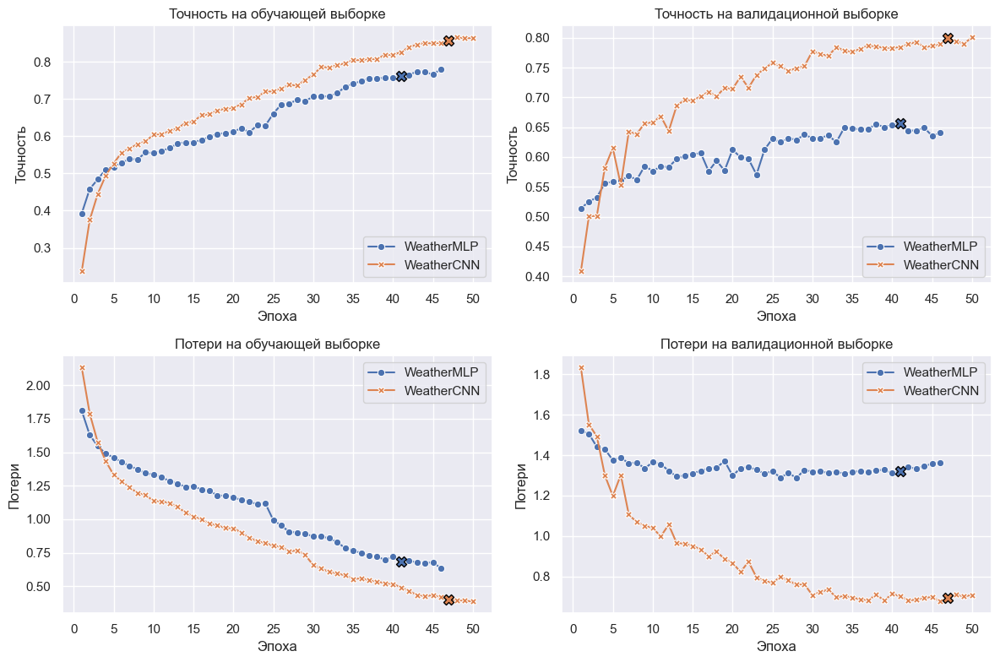

In [55]:
records_list, records_pt_list = [], []
best_epochs, best_epochs_pt = [], []

for model_name, history in histories.items():
    best_epoch = history["best_epoch"]

    best_epoch_metrics = {
        "model": model_name,
        "best_epoch": best_epoch,
        "train_acc": history["train_accs"][best_epoch - 1],
        "valid_acc": history["valid_accs"][best_epoch - 1],
        "train_loss": history["train_losses"][best_epoch - 1],
        "valid_loss": history["valid_losses"][best_epoch - 1],
    }

    if model_name in ["WeatherMLP", "WeatherCNN"]:
        current_records_list = records_list
        best_epochs.append(best_epoch_metrics)
    else:
        current_records_list = records_pt_list
        best_epochs_pt.append(best_epoch_metrics)

    for epoch, (train_acc, valid_acc, train_loss, valid_loss) in enumerate(zip(
        history["train_accs"], history["valid_accs"], history["train_losses"], history["valid_losses"]
    )):
        current_records_list.append({
            "model": model_name,
            "epoch": epoch + 1,
            "train_acc": train_acc,
            "valid_acc": valid_acc,
            "train_loss": train_loss,
            "valid_loss": valid_loss,
        })
    
records_df = pd.DataFrame(records_list)
records_pt_df = pd.DataFrame(records_pt_list)

plot_params = {
    "y": ["train_acc", "valid_acc", "train_loss", "valid_loss"],
    "title": [
        "Точность на обучающей выборке",
        "Точность на валидационной выборке",
        "Потери на обучающей выборке",
        "Потери на валидационной выборке",
    ],
    "ylabel": ["Точность", "Потери"],
}

n_rows, n_cols = 2, 2
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
axes = axes.flatten()

for i, ax in enumerate(axes):
    metric = plot_params["y"][i]

    sns.lineplot(
        data=records_df, x="epoch", y=metric, hue="model", style="model", dashes=False, markers=True, ax=ax,
    ).set(
        title=plot_params["title"][i], xlabel="Эпоха", xticks=range(0, 51, 5),
        ylabel=plot_params["ylabel"][i // 2],
    )

    for epoch, color in zip(best_epochs, sns.color_palette(n_colors=len(best_epochs))):
        ax.scatter(
            x=epoch["best_epoch"], y=epoch[metric], s=75,
            color=color, marker="X", edgecolor="black", zorder=5,
        )

    ax.legend(title="", loc="lower right" if i < 2 else "upper right")

plt.tight_layout()

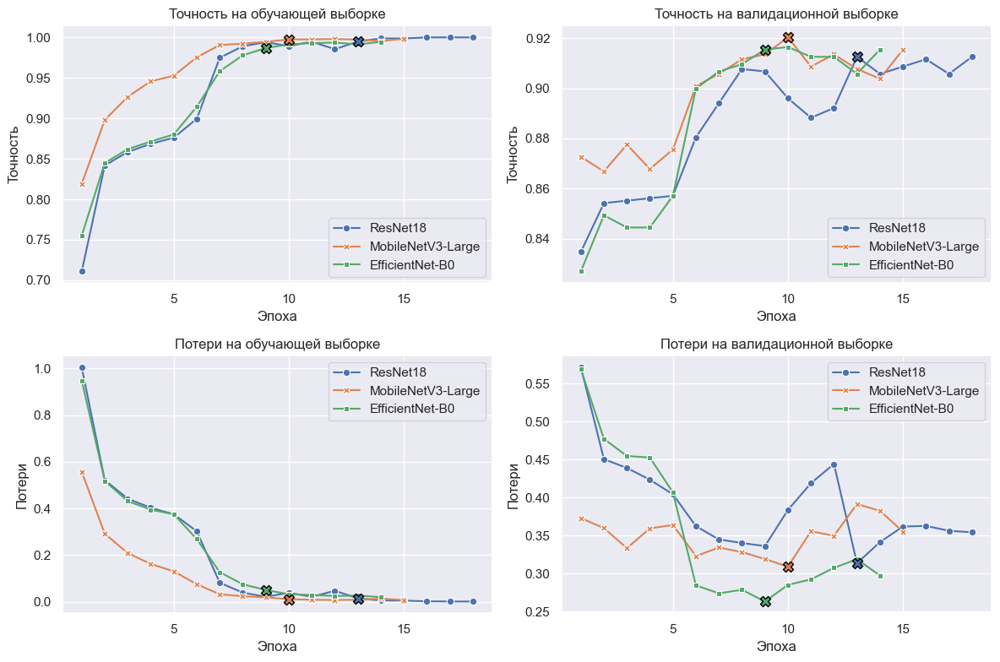

In [57]:
n_rows, n_cols = 2, 2
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 8))
axes = axes.flatten()

for i, ax in enumerate(axes):
    metric = plot_params["y"][i]

    sns.lineplot(
        data=records_pt_df, x="epoch", y=metric, hue="model", style="model", dashes=False, markers=True, ax=ax,
    ).set(
        title=plot_params["title"][i], xlabel="Эпоха", xticks=range(0, 21, 5),
        ylabel=plot_params["ylabel"][i // 2],
    )

    for epoch, color in zip(best_epochs_pt, sns.color_palette(n_colors=len(best_epochs_pt))):
        ax.scatter(
            x=epoch["best_epoch"], y=epoch[metric], s=75,
            color=color, marker="X", edgecolor="black", zorder=5,
        )

    ax.legend(title="", loc="lower right" if i < 2 else "upper right")

plt.tight_layout()

# Тестирование и оценка качества моделей